In [2]:
import os
import glob
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import scipy.sparse as sp
import time
import gget
import anndata as an
import scanpy as sc
import scanpy.external as sce
import h5py
import scipy
from scipy.spatial.distance import cdist
from scipy.stats import zscore
from tqdm import tqdm
from statsmodels.stats.multitest import multipletests
from adjustText import adjust_text
from itertools import combinations
import gseapy as gp
from gseapy.parser import download_library
import textwrap
from collections import Counter
from collections import defaultdict

sc.settings.verbosity = 2
sc.logging.print_header()

Package,Version
pandas,2.2.3
numpy,1.26.4
matplotlib,3.10.0
seaborn,0.13.2
scipy,1.15.2
gget,0.3.7
anndata,0.11.4
scanpy,1.11.2
h5py,3.12.1
tqdm,4.67.1


In [2]:
import scanpy as sc
print(sc.__version__)

1.11.2


# Load in processed AnnData

In [3]:
start = time.perf_counter()

path = "/nfs/turbo/umms-indikar/shared/projects/hybrid_reprogramming/anndata/processed_merged_gene_data.h5ad"

adata = sc.read_h5ad(path)

sc.logging.print_memory_usage() 
print(f"Total time: {time.perf_counter() - start:.2f} seconds")

adata

Memory usage: current 2.57 GB, difference +2.57 GB
Total time: 6.13 seconds


AnnData object with n_obs × n_vars = 16367 × 25126
    obs: 'MYOD-fb_counts', 'PRRX1-fb_counts', 'PRRX1_MYOD-fb_counts', 'assigned_condition', 'total_fb_counts', 'condition_counts_rate', 'G1-fb_counts', 'G2M-fb_counts', 'S-fb_counts', 'dataset', 'total_reads', 'total_genes', 'pooled_condition', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'outlier', 'mt_outlier', 'leiden', 'cluster_str', 'S_score', 'G2M_score', 'phase'
    var: 'gene_id', 'gene_type', 'Chromosome', 'Start', 'End', 'mt', 'ribo', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'n_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'highly_varia

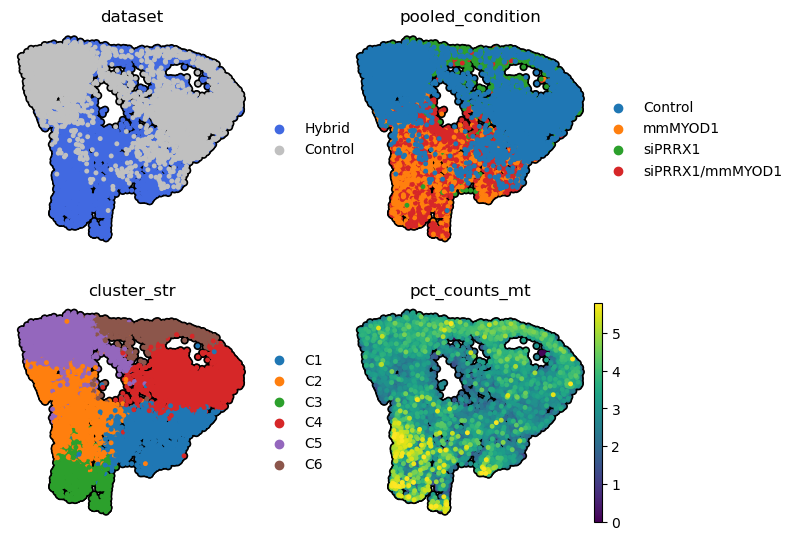

In [4]:
obs_to_plot = ['dataset', 'pooled_condition', 'cluster_str', 'pct_counts_mt']

plt.rcParams['figure.figsize'] = 3, 3

sc.pl.umap(
    adata,
    color=obs_to_plot,
    size=50,
    ncols=2,
    add_outline=True,
    outline_color=('k', 'k'),
    frameon=False,
    alpha=1,
)

In [4]:
# Quiescence-related TFs from Mitra et al. (2025)
quiescence_genes = [
    "ATF3", "ATF4", "CTNNB1", "BACH2", "JUN", "CEBPB", "CEBPA", "CTCF",
    "E2F4", "E2F5", "E2F1", "E2F2", "E2F3", "ERG", "ETS1", "MECOM", "FOXC1", "FOXM1", "FOXO3",
    "FOXP1", "GATA6", "GFI1", "HES1", "HLF", "ID1", "ID4", "IKZF1", "KLF2", "KLF4", "KLF7",
    "KLF9", "LEF1", "MECP2", "MED1", "ELF4", "MXI1", "MYC", "NFKB1", "NKX2-3", "RBPJ", "NFE2L2", 
    "RARA", "NR1H3", "NR4A2", "PAX3", "PAX7", "PBX1", "PPARD", "SPI1", "REST", "RUNX1", "SALL2", "SATB1", 
    "TAL1", "STAT1", "STAT3", "STAT4", "TCF15", "TLE4", "TP53", "YAP1", "YY1", "ZEB1", "ZFP521", "ZNF521",
]

print(f"N total TFs: {len(quiescence_genes)}")

genes = [gene for gene in quiescence_genes if gene in adata.var_names]

genes_not = [gene for gene in quiescence_genes if gene not in adata.var_names]
# print(len(genes_not))

print(f"N TFs in adata: {len(genes)}\n")
print(", ".join(genes))

N total TFs: 65
N TFs in adata: 59

ATF3, ATF4, CTNNB1, BACH2, JUN, CEBPB, CEBPA, CTCF, E2F4, E2F5, E2F1, E2F2, E2F3, ERG, ETS1, MECOM, FOXC1, FOXM1, FOXO3, FOXP1, GATA6, HES1, HLF, ID1, ID4, KLF2, KLF4, KLF7, KLF9, LEF1, MECP2, MED1, ELF4, MXI1, MYC, NFKB1, RBPJ, NFE2L2, RARA, NR1H3, NR4A2, PAX3, PAX7, PBX1, PPARD, SPI1, REST, RUNX1, SALL2, SATB1, STAT1, STAT3, STAT4, TLE4, TP53, YAP1, YY1, ZEB1, ZNF521


In [6]:
genes_not

['GFI1', 'IKZF1', 'NKX2-3', 'TAL1', 'TCF15', 'ZFP521']

In [7]:
### Check for presence of alias gene names for TFs not in adata
# test = [
#     'ZNF163', 'GFI1A', 'SCN2', # aliases for GFI1
#     'IKAROS', 'PPP1R92', 'ZNFN1A1', 'LYF1', 'IK1', # aliases for IKZF1
#     'NKX23', 'NKX2C', 'CSX3', # alisases for NKX2-3
#     'BHLHA17', 'SCL', 'TCL5', # aliases for TAL1
#     'BHLHA40', 'BHLHEC2', 'PARAXIS', 'EC2', # aliases for TCF15
#     'EHZF', 'ZNF521', 'LIP3', # aliases for ZFP251
# ]

# [gene for gene in test if gene in adata.var_names]

In [23]:
# Load in DEGs
# deg_path = "/scratch/indikar_root/indikar1/shared_data/HYB/diff_expression/DEGs_by_condition_vs_control.csv"
deg_path = "/scratch/indikar_root/indikar1/shared_data/HYB/diff_expression/mmMYOD1_vs_control.csv"

deg = pd.read_csv(deg_path)
print(deg.shape)
deg.head()

sig = deg.copy()

### filter for significant DEGs
pval_cutoff = 0.05       # p-value threshold
logfc_cutoff = 0.5       # log fold change threshold

print("Filtering for significant DEGs...")
print(f"Using p-value cutoff: {pval_cutoff} and log fold change cutoff: {logfc_cutoff}")

sig['abs_lfc'] = sig['logfoldchanges'].apply('abs')

sig = sig[(sig['abs_lfc'] > logfc_cutoff) & (sig['pvals_adj'] < pval_cutoff)]

# pct_threshold = 0.4
# print(f"Filtering for genes exressed in at least {pct_threshold*100}% of the group...")
# sig = sig[sig['pct_nz_group'] > pct_threshold] 

print(f"N unique significant DEGs: {sig['names'].nunique()}\n")

sig.head()

(25126, 8)
Filtering for significant DEGs...
Using p-value cutoff: 0.05 and log fold change cutoff: 0.5
N unique significant DEGs: 7741



,Unnamed: 0,group,names,scores,logfoldchanges,pvals,pvals_adj,pct_nz_group,abs_lfc
0,0,mmMYOD1,MT-ND4,71.247650,2.768783,0.0,0.0,0.999113,2.768783
1,1,mmMYOD1,MYOD1,66.925995,31.986927,0.0,0.0,0.936170,31.986927
2,2,mmMYOD1,LINC-PINT,60.860970,2.704369,0.0,0.0,0.971631,2.704369
3,3,mmMYOD1,NAV3,59.871517,3.427659,0.0,0.0,0.922429,3.427659
4,4,mmMYOD1,TAF1D,55.939564,2.645126,0.0,0.0,0.956560,2.645126


# Just TFs

In [24]:
de_genes = [gene for gene in genes if gene in sig['names'].unique()]
print(f"N total quiescence TFs: {len(genes)}")
print(f"N DE quiescence TFs: {len(de_genes)}")

N total quiescence TFs: 59
N DE quiescence TFs: 31


Scoring quiescence TFs...

computing score 'DE_quiescence_score'
    finished (0:00:01)
computing score 'All_quiescence_score'
    finished (0:00:01)


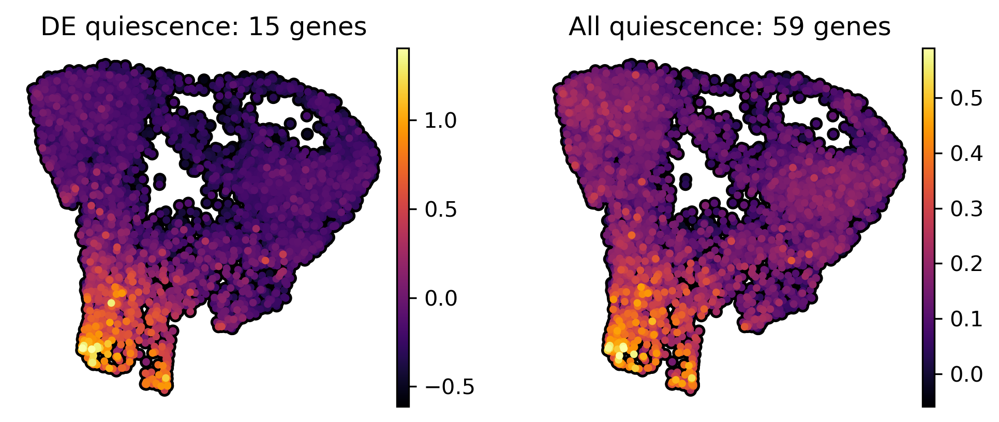

In [16]:
print("Scoring quiescence TFs...\n")

term = 'quiescence'

de_score_name = f"DE_{term}_score" # score just DE genes
all_score_name = f"All_{term}_score" # score all quiescence genes

ctrl_size = 1000

# just DE TFs
sc.tl.score_genes(
    bdata,
    gene_list=de_genes,
    score_name=de_score_name,
    ctrl_size=ctrl_size,
    use_raw=False,
    layer='log_norm',
)

# all TFs
sc.tl.score_genes(
    bdata,
    gene_list=genes,
    score_name=all_score_name,
    ctrl_size=ctrl_size,
    use_raw=False,
    layer='log_norm',
)

plt.rcParams['figure.figsize'] = 3, 3

sc.pl.umap(
    bdata,
    color=[de_score_name, all_score_name],
    size=50,
    ncols=2,
    add_outline=True,
    outline_color=('k', 'k'),
    color_map='inferno',
    frameon=False,
    alpha=1,
    title=[f"DE {term}: {len(de_genes)} genes", f"All {term}: {len(genes)} genes"],
    show=True
)

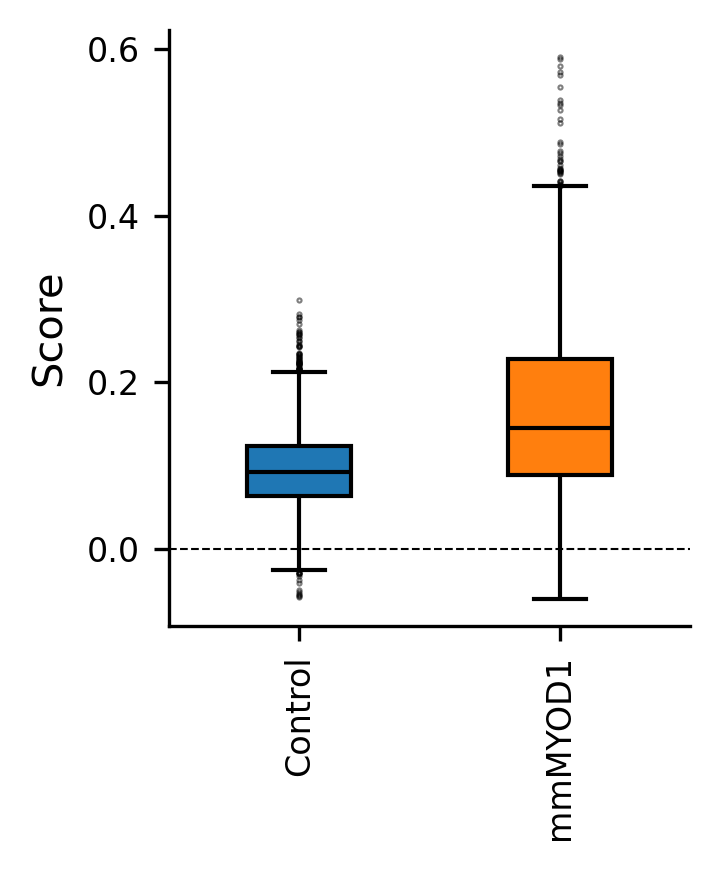

In [17]:
### Using ALL quiescence TFs

# color_map = {
#     "siPRRX1": "#9B5CA6",
#     "siPRRX1/mmMYOD1": "#9ECAE1",
#     "mmMYOD1": "#F5A35B",
#     "Control": "silver"
# }

plt.rcParams['figure.dpi'] = 300
plt.rcParams['figure.figsize'] = 2.5, 3

sns.boxplot(
    data=bdata.obs,
    x='pooled_condition',
    hue='pooled_condition',
    y='All_quiescence_score',
    width=0.4,
    linecolor='k',
    linewidth=1,
    # palette=color_map,
    legend=False,
    saturation=1,
    flierprops={'markersize': 0.5, 'alpha': 0.5},
    zorder=1,
)

plt.axhline(0, linestyle='--', linewidth=0.5, color='k', zorder=0)

plt.ylabel('Score')
plt.xticks(fontsize=8, rotation=90)
plt.yticks(fontsize=8)
plt.xlabel("")
sns.despine()

plt.tight_layout()
plt.show()   

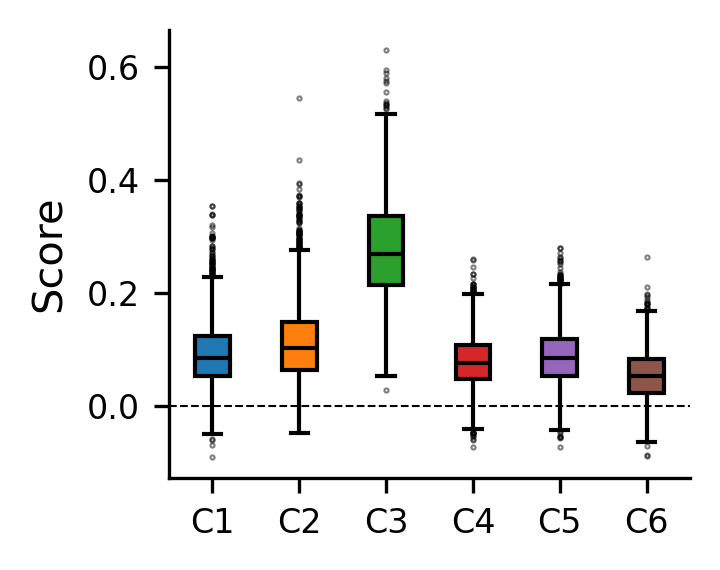

In [9]:
plt.rcParams['figure.figsize'] = 2.5, 2

sns.boxplot(
    data=adata.obs,
    x='cluster_str',
    hue='cluster_str',
    y='All_quiescence_score',
    width=0.4,
    linecolor='k',
    linewidth=1,
    legend=False,
    saturation=1,
    flierprops={'markersize': 0.5, 'alpha': 0.5},
    zorder=1,
)

plt.axhline(0, linestyle='--', linewidth=0.5, color='k', zorder=0)

plt.ylabel('Score')
plt.xticks(fontsize=8)
plt.yticks(fontsize=8)
plt.xlabel("")
sns.despine()

plt.tight_layout()
plt.show()

    using 'X_pca' with n_pcs = 50
Storing dendrogram info using `.uns['dendrogram_pooled_condition']`


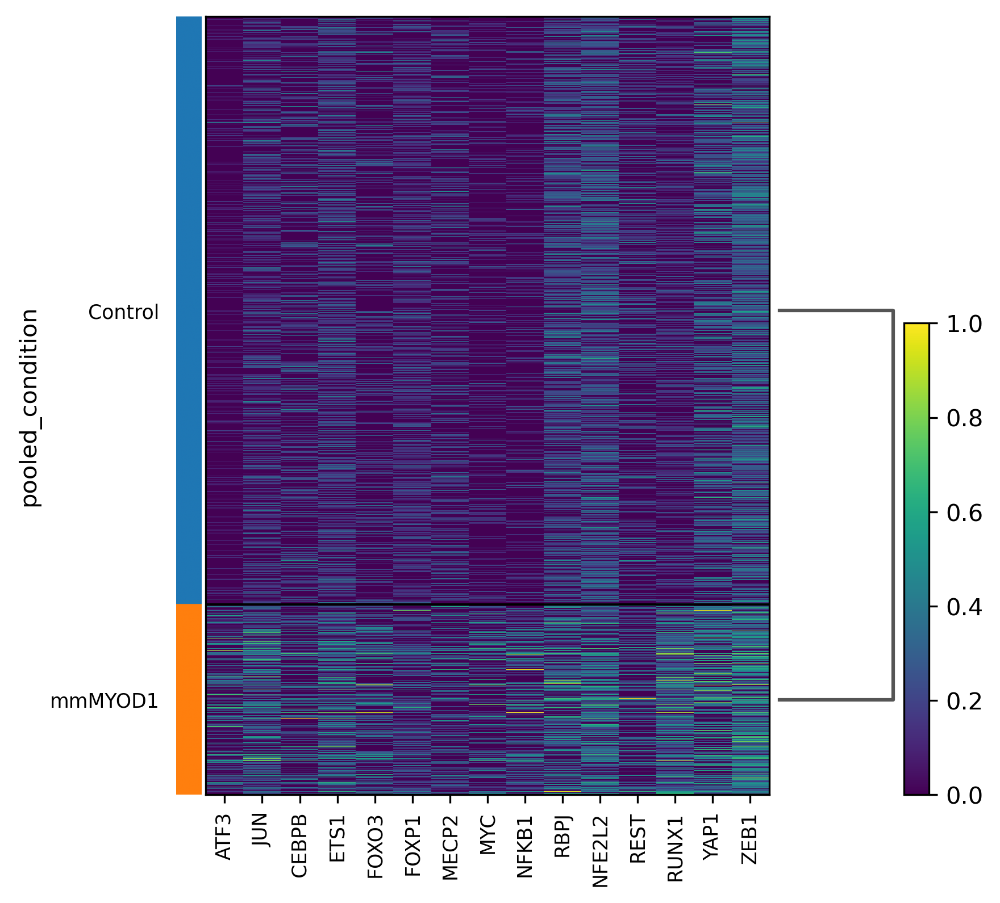

In [18]:
sc.pl.heatmap(
    bdata, 
    de_genes, 
    groupby="pooled_condition",
    cmap="viridis",
    dendrogram=True,
    use_raw=False,
    layer='log_norm',
    standard_scale='var',
)

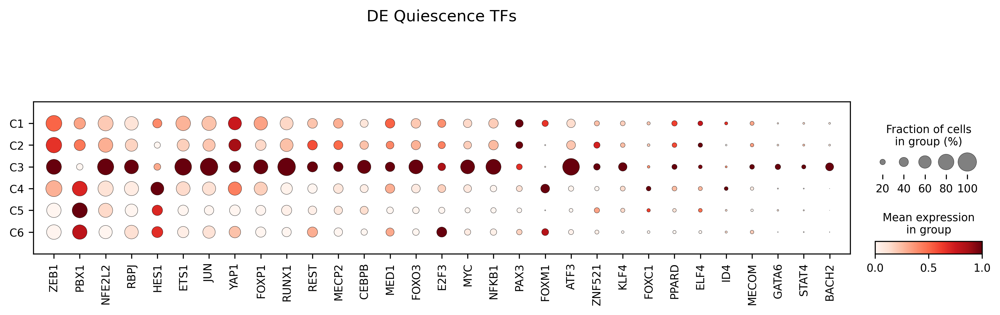

In [33]:
# sort genes by 'Control' expression
control_adata = bdata[bdata.obs['pooled_condition'] == 'Control'].copy()
control_adata.X = control_adata.layers['log_norm']
mean_expr = control_adata[:, de_genes].X.mean(axis=0)
if hasattr(mean_expr, "A1"):
    mean_expr = mean_expr.A1  

sorted_genes = pd.Series(mean_expr, index=de_genes).sort_values(ascending=False).index.tolist()

plt.rcdefaults()
plt.rcParams['figure.dpi'] = 300

sc.pl.dotplot(
    bdata,
    var_names=sorted_genes,
    groupby='cluster_str',
    use_raw=False,
    layer='log_norm',
    standard_scale='var',
    title='DE Quiescence TFs',
    # expression_cutoff=0.2,
)

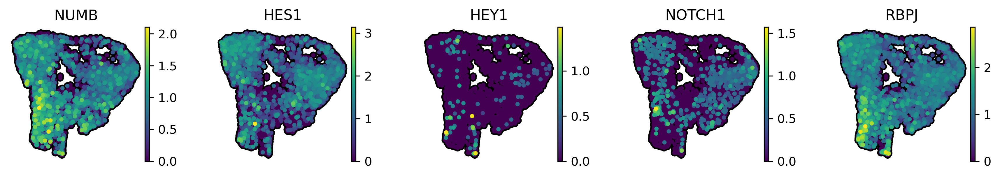

In [32]:
plt.rcParams['figure.figsize'] = 2, 2

sc.pl.umap(
    bdata,
    color=['NUMB', 'HES1', 'HEY1', 'NOTCH1', 'RBPJ'],
    size=50,
    ncols=5,
    add_outline=True,
    use_raw=False,
    layer='log_norm',
    outline_color=('k', 'k'),
    # color_map='inferno',
    frameon=False,
    alpha=1,
    show=True
)

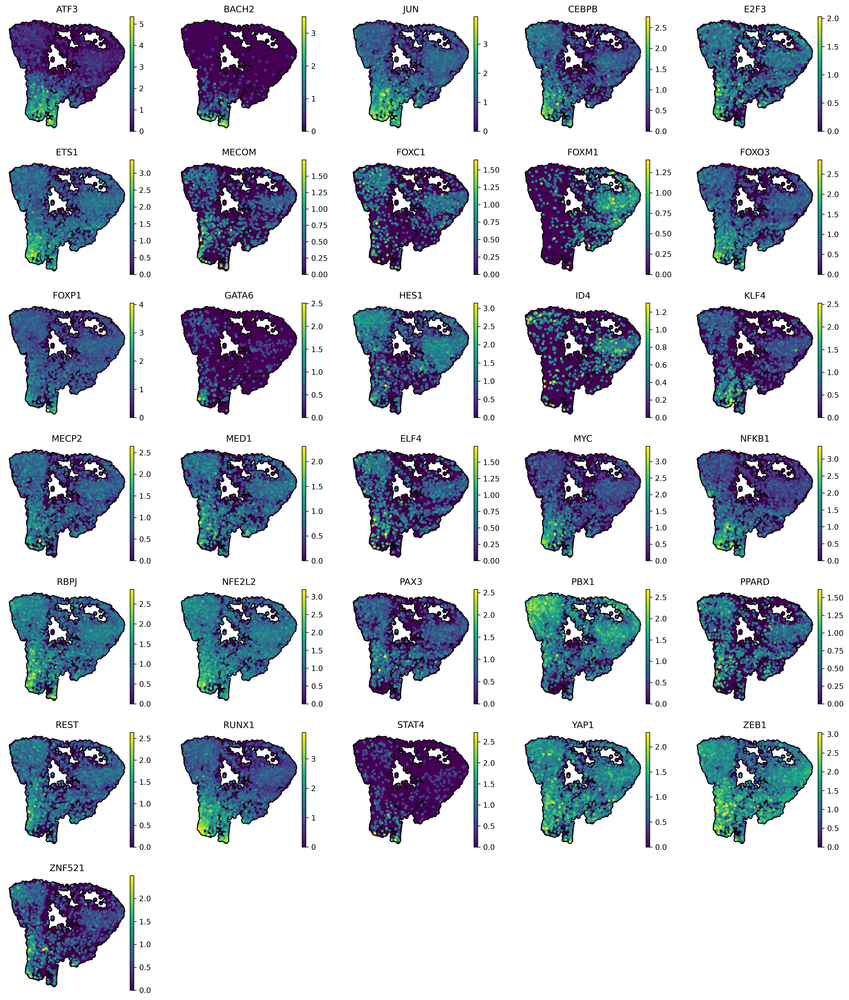

In [27]:
plt.rcParams['figure.figsize'] = 3, 3

sc.pl.umap(
    bdata,
    color=de_genes,
    size=50,
    ncols=5,
    add_outline=True,
    use_raw=False,
    layer='log_norm',
    outline_color=('k', 'k'),
    # color_map='inferno',
    frameon=False,
    alpha=1,
    show=True
)

In [11]:
adata

AnnData object with n_obs × n_vars = 16367 × 25126
    obs: 'MYOD-fb_counts', 'PRRX1-fb_counts', 'PRRX1_MYOD-fb_counts', 'assigned_condition', 'total_fb_counts', 'condition_counts_rate', 'G1-fb_counts', 'G2M-fb_counts', 'S-fb_counts', 'dataset', 'total_reads', 'total_genes', 'pooled_condition', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'outlier', 'mt_outlier', 'leiden', 'cluster_str', 'S_score', 'G2M_score', 'phase', 'DE_quiescence_score', 'All_quiescence_score'
    var: 'gene_id', 'gene_type', 'Chromosome', 'Start', 'End', 'mt', 'ribo', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'n_counts', 'highly_variable', 'means', '

In [12]:
cells_to_keep = (adata.obs['pooled_condition'] == 'mmMYOD1') | (adata.obs['dataset'] == 'Control')

bdata = adata[cells_to_keep].copy()
bdata

AnnData object with n_obs × n_vars = 9216 × 25126
    obs: 'MYOD-fb_counts', 'PRRX1-fb_counts', 'PRRX1_MYOD-fb_counts', 'assigned_condition', 'total_fb_counts', 'condition_counts_rate', 'G1-fb_counts', 'G2M-fb_counts', 'S-fb_counts', 'dataset', 'total_reads', 'total_genes', 'pooled_condition', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'outlier', 'mt_outlier', 'leiden', 'cluster_str', 'S_score', 'G2M_score', 'phase', 'DE_quiescence_score', 'All_quiescence_score'
    var: 'gene_id', 'gene_type', 'Chromosome', 'Start', 'End', 'mt', 'ribo', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'n_counts', 'highly_variable', 'means', 'd

In [13]:
bdata.obs['pooled_condition'].value_counts()




pooled_condition
Control    6960
mmMYOD1    2256
Name: count, dtype: int64

In [1]:
sig.head()

NameError: name 'sig' is not defined

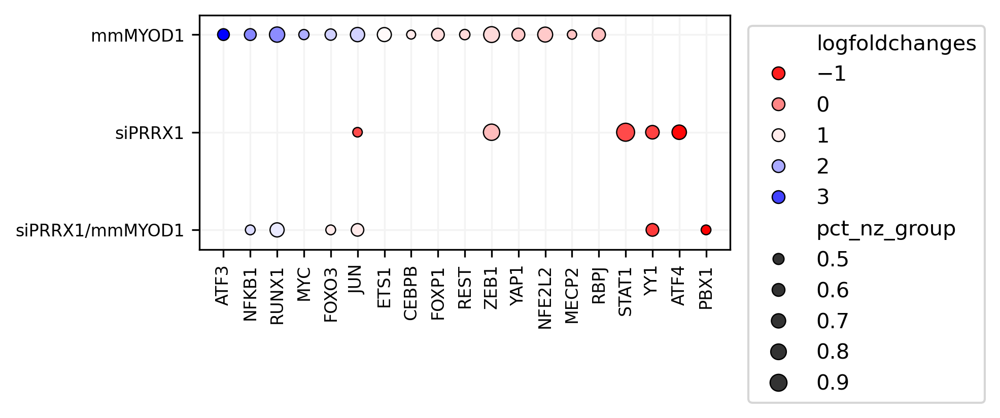

In [77]:
pdf = sig.copy()


pdf = pdf[pdf['names'].isin(de_genes)]

pdf = pdf.sort_values(by=['group', 'logfoldchanges'], ascending=[True, False])

# pdf = pdf[~pdf['names'].str.startswith('ENSG')]
# print(f"{pdf.shape=}")

# gene_list = pdf.groupby('group').head(n_genes)['names'].unique()


# print(len(gene_list))

# pdf = sig[sig['names'].isin(gene_list)].copy()


plt.rcParams['figure.dpi'] = 300
plt.rcParams['figure.figsize'] = 4.5, 2

sns.scatterplot(
    data=pdf,
    x='names',
    y='group',
    ec='k',
    linewidth=0.6,
    hue='logfoldchanges',
    palette='bwr_r',
    # hue_norm=(-4, 4),
    size='pct_nz_group',
    zorder=3,
)

y_margin = 0.1  # 10% margin on top and bottom
plt.gca().margins(y=y_margin) 

plt.grid(
    True, 
    c='#f3f3f3ff',
    zorder=0,
)

plt.ylabel("")
plt.xlabel("")

plt.gca().tick_params(axis='x', rotation=90, labelsize=8)#, ha='right')

plt.yticks(fontsize=8)
#plt.xticks(ha='right')

sns.move_legend(
    plt.gca(),
    loc='upper right',
    title='',
    bbox_to_anchor=(1.5, 1),   
)

plt.show()

In [65]:
# Load in DEGs
deg_path = "/scratch/indikar_root/indikar1/shared_data/HYB/diff_expression/DEGs_by_cluster.csv"

deg = pd.read_csv(deg_path)
print(deg.shape)
deg.head()

sig = deg.copy()

### filter for significant DEGs
pval_cutoff = 0.01       # p-value threshold
logfc_cutoff = 0.5       # log fold change threshold

print("Filtering for significant DEGs...")
print(f"Using p-value cutoff: {pval_cutoff} and log fold change cutoff: {logfc_cutoff}")

sig['abs_lfc'] = sig['logfoldchanges'].apply('abs')

sig = sig[(sig['abs_lfc'] > logfc_cutoff) & (sig['pvals_adj'] < pval_cutoff)]

# pct_threshold = 0.5
# print(f"Filtering for genes exressed in at least {pct_threshold*100}% of the group...")
# sig = sig[sig['pct_nz_group'] > pct_threshold] 

print(f"N unique significant DEGs: {sig['names'].nunique()}\n")

sig.head()

(150756, 9)
Filtering for significant DEGs...
Using p-value cutoff: 0.01 and log fold change cutoff: 0.5
N unique significant DEGs: 9394



,Unnamed: 0,group,names,scores,logfoldchanges,pvals,pvals_adj,pct_nz_group,pct_nz_reference,abs_lfc
0,0,C1,ISG20,44.099068,1.905105,0.0,0.0,0.888214,0.474239,1.905105
1,1,C1,MT2A,43.234380,0.832291,0.0,0.0,1.000000,1.000000,0.832291
2,2,C1,ISG15,42.707260,0.794879,0.0,0.0,1.000000,0.998968,0.794879
3,3,C1,IFIT3,41.180180,1.041141,0.0,0.0,1.000000,0.990418,1.041141
4,4,C1,BST2,40.717150,1.517867,0.0,0.0,0.925357,0.707378,1.517867


In [66]:
de_genes = [gene for gene in genes if gene in sig['names'].unique()]
print(f"N total quiescence TFs: {len(genes)}")
print(f"N DE quiescence TFs: {len(de_genes)}")

N total quiescence TFs: 59
N DE quiescence TFs: 39


Scoring quiescence TFs...

computing score 'DE_quiescence_score'
    finished (0:00:02)
computing score 'All_quiescence_score'
    finished (0:00:02)


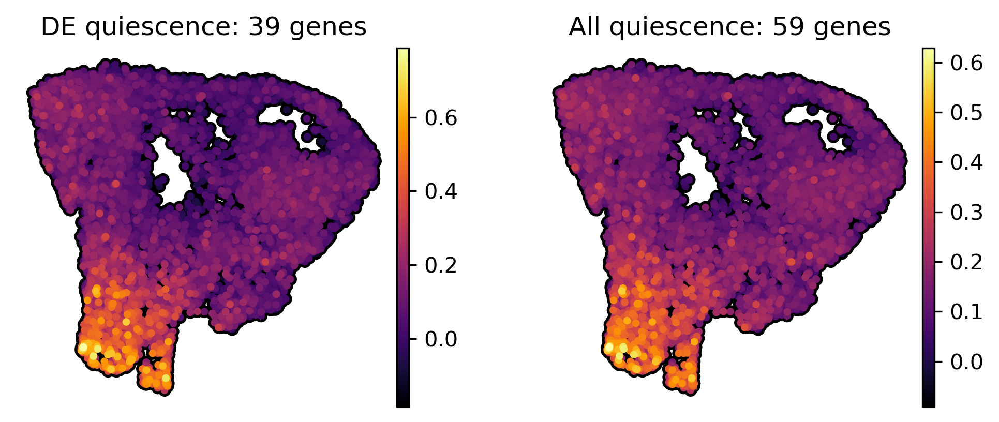

In [67]:
print("Scoring quiescence TFs...\n")

term = 'quiescence'

de_score_name = f"DE_{term}_score" # score just DE genes
all_score_name = f"All_{term}_score" # score all quiescence genes

ctrl_size = 1000

# just DE TFs
sc.tl.score_genes(
    adata,
    gene_list=de_genes,
    score_name=de_score_name,
    ctrl_size=ctrl_size,
    use_raw=False,
    layer='log_norm',
)

# all TFs
sc.tl.score_genes(
    adata,
    gene_list=genes,
    score_name=all_score_name,
    ctrl_size=ctrl_size,
    use_raw=False,
    layer='log_norm',
)

plt.rcParams['figure.figsize'] = 3, 3

sc.pl.umap(
    adata,
    color=[de_score_name, all_score_name],
    size=50,
    ncols=2,
    add_outline=True,
    outline_color=('k', 'k'),
    color_map='inferno',
    frameon=False,
    alpha=1,
    title=[f"DE {term}: {len(de_genes)} genes", f"All {term}: {len(genes)} genes"],
    show=True
)

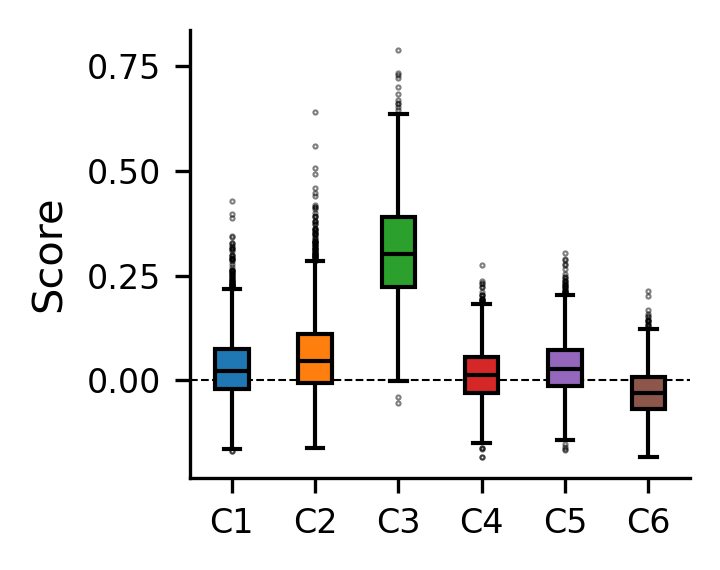

In [68]:
plt.rcParams['figure.figsize'] = 2.5, 2

sns.boxplot(
    data=adata.obs,
    x='cluster_str',
    hue='cluster_str',
    y='DE_quiescence_score',
    width=0.4,
    linecolor='k',
    linewidth=1,
    legend=False,
    saturation=1,
    flierprops={'markersize': 0.5, 'alpha': 0.5},
    zorder=1,
)

plt.axhline(0, linestyle='--', linewidth=0.5, color='k', zorder=0)

plt.ylabel('Score')
plt.xticks(fontsize=8)
plt.yticks(fontsize=8)
plt.xlabel("")
sns.despine()

plt.tight_layout()
plt.show()

# TFs and their target genes

In [11]:
fpath = "../resources/quiescence_mitra_2025.txt"
df = pd.read_csv(fpath)
print(df.head().to_string())

  Transcription factor                                                             Targets                                            Example cell types
0                 ATF3                                                                 H2B                                             Muscle stem cells
1                 ATF4                                            ATF3; HSF1; HSPA8; DDIT4                                           Gastric chief cells
2            Β-CATENIN  ITGA4; ITGA5; ITGA11; ITGAL; NCAM2; CDH1; CDH5; CDH12; CDH18; RELN                                      Hematopoietic stem cells
3                BACH2           IFNG; CD44; CCL1; CCL9; ICAM1; LIF; LTA; GADD45B; TTC39C5                                                       T cells
4                C-JUN                 BHIHB2; CTGF; CYR61; FOSB; NR4A1; NR4A2; PLAU; RGS2  Cultured human glioblastoma cells; pancreatic stellate cells


In [12]:
tfs = set(df['Transcription factor'])

# 2. split the Targets column on “;”, explode into one gene per row, strip whitespace
targets = (
    df['Targets']
      .str.split(';')            # split into lists
      .explode()                 # one entry per row
      .dropna()                  # drop any NaN
      .str.strip()               # remove leading/trailing spaces
)

unique_targets = set(targets)

# 3. union TFs and targets
all_genes = tfs.union(unique_targets)

# if you just want the list:
all_genes_list = sorted(all_genes)
all_genes_list = [x for x in all_genes_list if x in adata.var_names]
print(len(all_genes_list))
print(all_genes_list)

151
['ABCC1', 'ACE2', 'ACOX1', 'ACSBG1', 'ACSL3', 'ACSS1', 'AKR1B10', 'ALDH3B1', 'ALDH4A1', 'ANGPT2', 'ANKRD1', 'ATF3', 'ATF4', 'ATM', 'AXIN2', 'BACH2', 'BMP2', 'BMP4', 'BRCA2', 'CCL1', 'CD44', 'CDC20', 'CDC25A', 'CDC6', 'CDH1', 'CDH12', 'CDH18', 'CDH5', 'CDK4', 'CDKN1A', 'CDKN1C', 'CHRNA7', 'CTCF', 'CUL1', 'CXCR4', 'DDIT4', 'DHFR', 'DKK1', 'DUSP7', 'EGFR', 'EMB', 'ERG', 'ETS1', 'EZH2', 'FGFR3', 'FOSB', 'FOXM1', 'FOXO1', 'FOXP1', 'GADD45B', 'GATA2', 'GATA6', 'GPLD1', 'GRIN2C', 'HES1', 'HHIP', 'HK2', 'HLF', 'HSF1', 'HSPA8', 'ICAM1', 'ID1', 'ID2', 'ID3', 'ID4', 'IGFBP3', 'IGFBP6', 'IGFBP7', 'IL1R1', 'INCENP', 'IQGAP1', 'ITGA10', 'ITGA11', 'ITGA3', 'ITGA4', 'ITGA5', 'ITGAL', 'ITGAM', 'JUNB', 'KCNJ8', 'KCNQ1', 'KIT', 'KLF2', 'KLF4', 'KLF7', 'KLF9', 'LEF1', 'LFNG', 'LIF', 'LPAR1', 'LTA', 'MCL1', 'MCM4', 'MDM2', 'MECP2', 'MED1', 'MTOR', 'MXI1', 'MYC', 'MYPN', 'NCAM2', 'NCAPG', 'NFATC1', 'NPM1', 'NR1H3', 'NR4A1', 'NR4A2', 'NRP1', 'NTRK2', 'NUMB', 'ORC1', 'P2RX7', 'PARP1', 'PAX3', 'PAX7', 'PBX

In [13]:
# genes
missing_TFs = [gene for gene in genes if gene not in all_genes_list]
print(f"N TFs missing from all_genes_list: {len(missing_TFs)}")
print(missing_TFs)

# Add missing TFs to all_genes_list
combined = all_genes_list + missing_TFs
print(f"\nTotal TFs/target genes from Mitra et al: {len(combined)}")
print(combined)

N TFs missing from all_genes_list: 23
['CTNNB1', 'JUN', 'CEBPB', 'CEBPA', 'E2F4', 'E2F5', 'E2F1', 'E2F2', 'E2F3', 'MECOM', 'FOXC1', 'FOXO3', 'ELF4', 'NFKB1', 'RBPJ', 'NFE2L2', 'PPARD', 'SPI1', 'STAT1', 'STAT3', 'TLE4', 'YAP1', 'ZNF521']

Total TFs/target genes from Mitra et al: 174
['ABCC1', 'ACE2', 'ACOX1', 'ACSBG1', 'ACSL3', 'ACSS1', 'AKR1B10', 'ALDH3B1', 'ALDH4A1', 'ANGPT2', 'ANKRD1', 'ATF3', 'ATF4', 'ATM', 'AXIN2', 'BACH2', 'BMP2', 'BMP4', 'BRCA2', 'CCL1', 'CD44', 'CDC20', 'CDC25A', 'CDC6', 'CDH1', 'CDH12', 'CDH18', 'CDH5', 'CDK4', 'CDKN1A', 'CDKN1C', 'CHRNA7', 'CTCF', 'CUL1', 'CXCR4', 'DDIT4', 'DHFR', 'DKK1', 'DUSP7', 'EGFR', 'EMB', 'ERG', 'ETS1', 'EZH2', 'FGFR3', 'FOSB', 'FOXM1', 'FOXO1', 'FOXP1', 'GADD45B', 'GATA2', 'GATA6', 'GPLD1', 'GRIN2C', 'HES1', 'HHIP', 'HK2', 'HLF', 'HSF1', 'HSPA8', 'ICAM1', 'ID1', 'ID2', 'ID3', 'ID4', 'IGFBP3', 'IGFBP6', 'IGFBP7', 'IL1R1', 'INCENP', 'IQGAP1', 'ITGA10', 'ITGA11', 'ITGA3', 'ITGA4', 'ITGA5', 'ITGAL', 'ITGAM', 'JUNB', 'KCNJ8', 'KCNQ1', 'KIT'

N total quiescence TFs/genes: 174
N DE quiescence TFs/genes: 104
Scoring quiescence genes...

computing score 'DE_quiescence_score'
    finished (0:00:02)
computing score 'All_quiescence_score'
    finished (0:00:02)


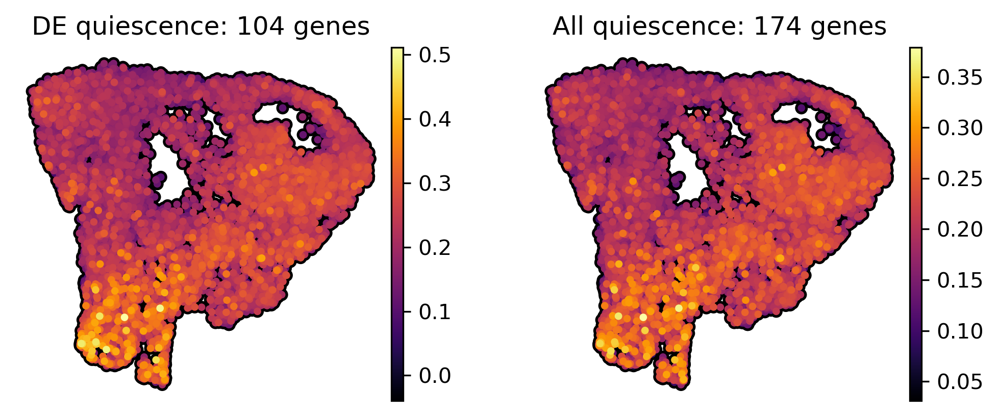

In [36]:
de_combined_genes = [gene for gene in combined if gene in sig['names'].unique()]
print(f"N total quiescence TFs/genes: {len(combined)}")
print(f"N DE quiescence TFs/genes: {len(de_combined_genes)}")


print("Scoring quiescence genes...\n")

term = 'quiescence'

de_score_name = f"DE_{term}_score" # score just DE genes
all_score_name = f"All_{term}_score" # score all quiescence genes

ctrl_size = 1000

# just DE TFs/genes
sc.tl.score_genes(
    adata,
    gene_list=de_combined_genes,
    score_name=de_score_name,
    ctrl_size=ctrl_size,
    use_raw=False,
    layer='log_norm',
)

# all TFs/genes
sc.tl.score_genes(
    adata,
    gene_list=combined,
    score_name=all_score_name,
    ctrl_size=ctrl_size,
    use_raw=False,
    layer='log_norm',
)

plt.rcParams['figure.figsize'] = 3, 3

sc.pl.umap(
    adata,
    color=[de_score_name, all_score_name],
    size=50,
    ncols=2,
    add_outline=True,
    outline_color=('k', 'k'),
    color_map='inferno',
    frameon=False,
    alpha=1,
    title=[f"DE {term}: {len(de_combined_genes)} genes", f"All {term}: {len(combined)} genes"],
    show=True
)

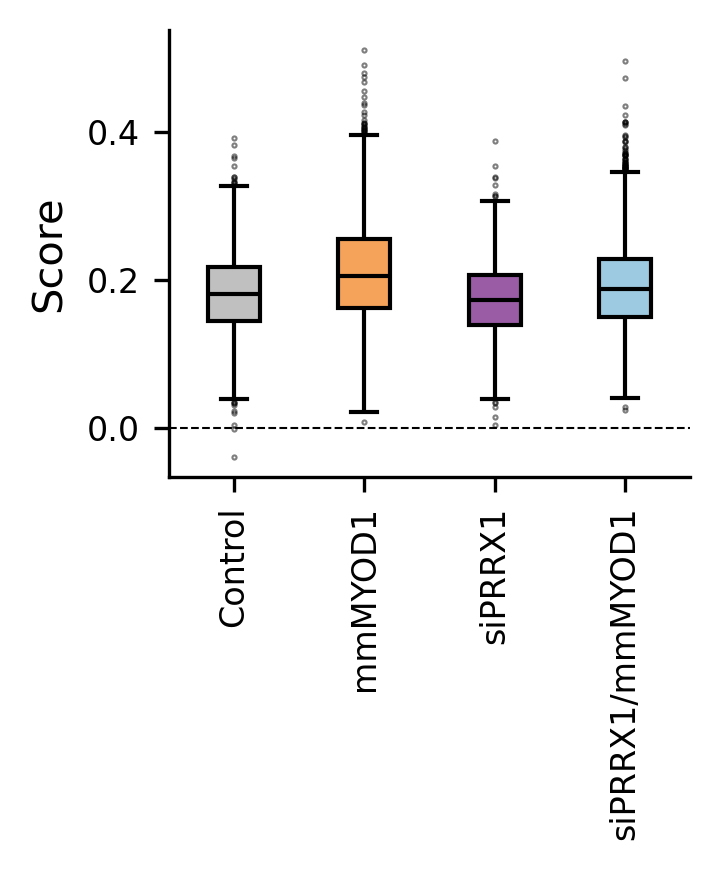

In [37]:
plt.rcParams['figure.dpi'] = 300
plt.rcParams['figure.figsize'] = 2.5, 3

sns.boxplot(
    data=adata.obs,
    x='pooled_condition',
    hue='pooled_condition',
    y='DE_quiescence_score',
    width=0.4,
    linecolor='k',
    linewidth=1,
    palette=color_map,
    legend=False,
    saturation=1,
    flierprops={'markersize': 0.5, 'alpha': 0.5},
    zorder=1,
)

plt.axhline(0, linestyle='--', linewidth=0.5, color='k', zorder=0)

plt.ylabel('Score')
plt.xticks(fontsize=8, rotation=90)
plt.yticks(fontsize=8)
plt.xlabel("")
sns.despine()

plt.tight_layout()
plt.show()   

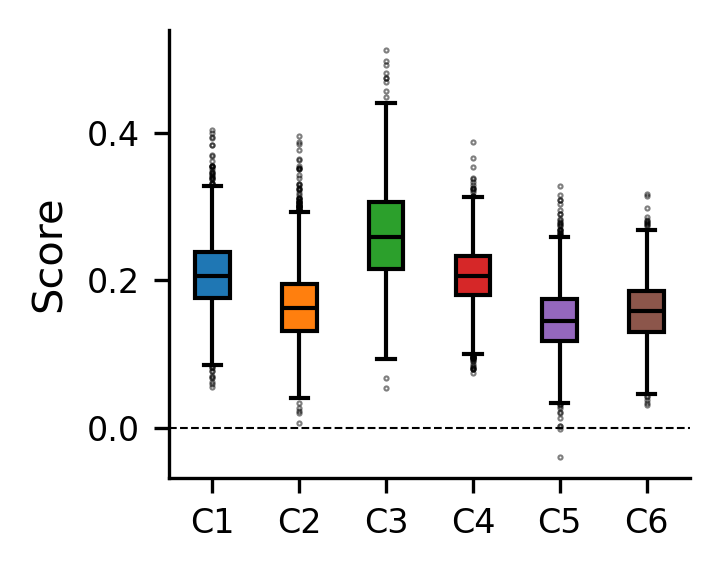

In [ ]:
plt.rcParams['figure.figsize'] = 2.5, 2

sns.boxplot(
    data=adata.obs,
    x='cluster_str',
    hue='cluster_str',
    y='DE_quiescence_score',
    width=0.4,
    linecolor='k',
    linewidth=1,
    legend=False,
    saturation=1,
    flierprops={'markersize': 0.5, 'alpha': 0.5},
    zorder=1,
)

plt.axhline(0, linestyle='--', linewidth=0.5, color='k', zorder=0)

plt.ylabel('Score')
plt.xticks(fontsize=8)
plt.yticks(fontsize=8)
plt.xlabel("")
sns.despine()

plt.tight_layout()
plt.show()  

In [15]:
# # sort genes by expression
# control_adata = adata[adata.obs['pooled_condition'] == 'Control'].copy()

# control_adata.X = control_adata.layers['log_norm']

# mean_expr = control_adata[:, de_genes].X.mean(axis=0)

# if hasattr(mean_expr, "A1"):
#     mean_expr = mean_expr.A1  

# sorted_genes = pd.Series(mean_expr, index=de_genes).sort_values(ascending=False).index.tolist()

# sc.pl.dotplot(
#     adata,
#     var_names=sorted_genes,
#     groupby='pooled_condition',
#     use_raw=False,
#     layer='log_norm',
#     standard_scale='var',
#     title='DE Quiescence TFs',
# )

In [16]:
# sc.pl.dotplot(
#     adata,
#     var_names=sorted_genes,
#     groupby='pooled_condition',
#     use_raw=False,
#     layer='log_norm',
#     # standard_scale='var',
#     title='DE Quiescence TFs',
# )